### Logistic Regression for Solving Classification Problems

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured ([source](http://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/)):


<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">


The output of the sigmoid function is called a logistic, hence the name _logistic regression_. For a mathematical discussion of logistic regression, sigmoid activation and cross entropy, check out [this YouTube playlist](https://www.youtube.com/watch?v=-la3q9d7AKQ&list=PLNeKWBMsAzboR8vvhnlanxCNr2V7ITuxy&index=1). Logistic regression can also be applied to multi-class classification problems, with a few modifications.

In [1]:
## Downloading Datasets

In [2]:
!pip install opendatasets --upgrade --quiet

In [3]:
import opendatasets as od

In [4]:
dataset_url = 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'

In [5]:
od.download(dataset_url)

Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


In [6]:
import os

In [7]:
data_dir = './weather-dataset-rattle-package'

In [8]:
os.listdir(data_dir)

['weatherAUS.csv']

In [9]:
train_csv = data_dir + '/weatherAUS.csv'

In [39]:
import pandas as pd

In [40]:
raw_df = pd.read_csv(train_csv)

In [41]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
Date             145460 non-null object
Location         145460 non-null object
MinTemp          143975 non-null float64
MaxTemp          144199 non-null float64
Rainfall         142199 non-null float64
Evaporation      82670 non-null float64
Sunshine         75625 non-null float64
WindGustDir      135134 non-null object
WindGustSpeed    135197 non-null float64
WindDir9am       134894 non-null object
WindDir3pm       141232 non-null object
WindSpeed9am     143693 non-null float64
WindSpeed3pm     142398 non-null float64
Humidity9am      142806 non-null float64
Humidity3pm      140953 non-null float64
Pressure9am      130395 non-null float64
Pressure3pm      130432 non-null float64
Cloud9am         89572 non-null float64
Cloud3pm         86102 non-null float64
Temp9am          143693 non-null float64
Temp3pm          141851 non-null float64
RainToday        142199 non-null obje

In [43]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

## Exploratory Data Analysis and Visualization

Before training a machine learning model, its always a good idea to explore the distributions of various columns and see how they are related to the target column. Let's explore and visualize the data using the Plotly, Matplotlib and Seaborn libraries. Follow these tutorials to learn how to use these libraries:

- https://jovian.ai/aakashns/python-matplotlib-data-visualization
- https://jovian.ai/aakashns/interactive-visualization-plotly
- https://jovian.ai/aakashns/dataviz-cheatsheet

In [44]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [45]:
!pip install plotly matplotlib seaborn --quiet

In [46]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [47]:
raw_df.Location.nunique()

49

In [49]:
px.histogram(raw_df, x='Location', title='Location vs. Rainy Days', color='RainToday')

In [50]:
px.histogram(raw_df, 
             x='Temp3pm', 
             title='Temperature at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow')

In [51]:
px.histogram(raw_df, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

In [52]:
px.scatter(raw_df.sample(2000), 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

In [53]:
px.scatter(raw_df.sample(2000), 
           title='Temp (3 pm) vs. Humidity (3 pm)',
           x='Temp3pm',
           y='Humidity3pm',
           color='RainTomorrow')

In [23]:
#Visualize other datasets

In [55]:
use_Sample=False

In [56]:
sample_fraction=0.1

In [57]:
if use_Sample:
    raw_df=raw_df.sample(frac=sample_fraction).copy()

In [58]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
121818,2011-10-24,Perth,13.7,23.2,0.0,5.4,7.1,NNE,37.0,E,...,62.0,49.0,1017.2,1013.6,6.0,7.0,18.0,22.5,No,Yes
39840,2009-10-30,Williamtown,11.3,25.8,0.0,4.8,10.6,NE,33.0,NaN,...,75.0,53.0,1022.9,1020.1,1.0,1.0,20.4,25.0,No,No
22442,2012-09-15,NorfolkIsland,15.2,19.0,11.4,5.6,7.6,NNE,69.0,SSW,...,71.0,53.0,1016.2,1014.8,7.0,1.0,16.9,18.1,Yes,No
81623,2010-09-18,Dartmoor,8.6,12.3,1.8,1.0,2.5,SSW,41.0,WSW,...,99.0,94.0,1023.8,1022.6,NaN,NaN,10.4,11.1,Yes,Yes
106057,2010-05-11,Woomera,9.9,18.0,0.0,6.2,10.2,SSW,50.0,S,...,55.0,31.0,1022.2,1021.0,0.0,1.0,13.1,17.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102052,2016-02-11,MountGambier,11.9,26.5,0.0,4.8,11.6,S,43.0,SSE,...,71.0,43.0,1018.0,1016.0,3.0,6.0,19.2,24.9,No,No
83657,2016-07-11,Dartmoor,9.4,12.9,4.2,0.8,NaN,N,70.0,NNW,...,71.0,90.0,995.3,996.2,NaN,NaN,11.2,12.5,Yes,Yes
32726,2015-04-24,Sydney,15.0,25.1,0.0,2.2,8.5,W,19.0,WNW,...,89.0,59.0,1008.0,1004.4,4.0,4.0,17.3,23.9,No,No
94485,2012-04-19,Townsville,19.7,30.2,0.0,5.6,10.0,ENE,35.0,NNW,...,73.0,66.0,1014.5,1011.1,7.0,7.0,26.1,28.6,No,No


## Training, Validation and Test Sets

While building real-world machine learning models, it is quite common to split the dataset into three parts:

1. **Training set** - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique. 


2. **Validation set** - used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model. Picking a good validation set is essential for training models that generalize well. [Learn more here.](https://www.fast.ai/2017/11/13/validation-sets/)


3. **Test set** - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.


<img src="https://i.imgur.com/j8eITrK.png" width="480">


As a general rule of thumb you can use around 60% of the data for the training set, 20% for the validation set and 20% for the test set. If a separate test set is already provided, you can use a 75%-25% training-validation split.


When rows in the dataset have no inherent order, it's common practice to pick random subsets of rows for creating test and validation sets. This can be done using the `train_test_split` utility from `scikit-learn`. Learn more about it here: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [59]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
121818,2011-10-24,Perth,13.7,23.2,0.0,5.4,7.1,NNE,37.0,E,...,62.0,49.0,1017.2,1013.6,6.0,7.0,18.0,22.5,No,Yes
39840,2009-10-30,Williamtown,11.3,25.8,0.0,4.8,10.6,NE,33.0,NaN,...,75.0,53.0,1022.9,1020.1,1.0,1.0,20.4,25.0,No,No
22442,2012-09-15,NorfolkIsland,15.2,19.0,11.4,5.6,7.6,NNE,69.0,SSW,...,71.0,53.0,1016.2,1014.8,7.0,1.0,16.9,18.1,Yes,No
81623,2010-09-18,Dartmoor,8.6,12.3,1.8,1.0,2.5,SSW,41.0,WSW,...,99.0,94.0,1023.8,1022.6,NaN,NaN,10.4,11.1,Yes,Yes
106057,2010-05-11,Woomera,9.9,18.0,0.0,6.2,10.2,SSW,50.0,S,...,55.0,31.0,1022.2,1021.0,0.0,1.0,13.1,17.6,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102052,2016-02-11,MountGambier,11.9,26.5,0.0,4.8,11.6,S,43.0,SSE,...,71.0,43.0,1018.0,1016.0,3.0,6.0,19.2,24.9,No,No
83657,2016-07-11,Dartmoor,9.4,12.9,4.2,0.8,NaN,N,70.0,NNW,...,71.0,90.0,995.3,996.2,NaN,NaN,11.2,12.5,Yes,Yes
32726,2015-04-24,Sydney,15.0,25.1,0.0,2.2,8.5,W,19.0,WNW,...,89.0,59.0,1008.0,1004.4,4.0,4.0,17.3,23.9,No,No
94485,2012-04-19,Townsville,19.7,30.2,0.0,5.6,10.0,ENE,35.0,NNW,...,73.0,66.0,1014.5,1011.1,7.0,7.0,26.1,28.6,No,No


In [60]:
!pip install scikit-learn --upgrade --quiet

In [80]:
from sklearn.model_selection   import train_test_split
train_val_df, test_df = train_test_split(raw_df, test_size=0.2, random_state=42)

In [81]:
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [82]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (8447, 23)
val_df.shape : (2816, 23)
test_df.shape : (2816, 23)


However, while working with dates, it's often a better idea to separate the training, validation and test sets with time, so that the model is trained on data from the past and evaluated on data from the future.

For the current dataset, we can use the Date column in the dataset to create another column for year. We'll pick the last two years for the test set, and one year before it for the validation set.

As we are using **historical** data we need to consider this approach based on the year we should divide our dataset based on the time.
- We will use Training data till 2014 and model will be trained based on the dataset.
- 2015 as validating set
- Testing will be on 2016 and 2017.

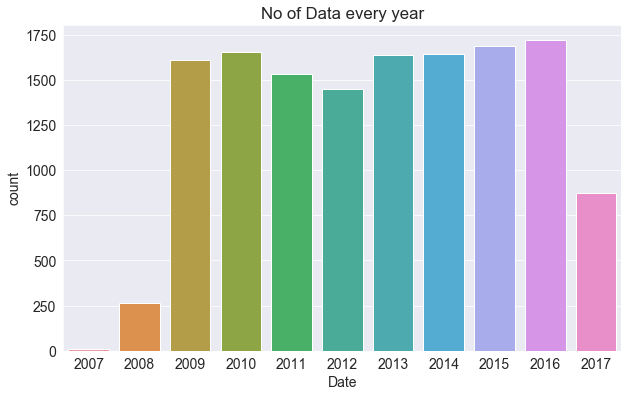

In [66]:
plt.title("No of Data every year")
sns.countplot(x=pd.to_datetime(raw_df.Date).dt.year)

In [78]:
year = pd.to_datetime(raw_df.Date).dt.year

train_df = raw_df[year < 2015]
val_df = raw_df[year == 2015]
test_df = raw_df[year > 2015]

In [79]:
print("Training Dataset",train_df.shape)
print("Training Dataset",val_df.shape)
print("Training Dataset",test_df.shape)

Training Dataset (9801, 23)
Training Dataset (1686, 23)
Training Dataset (2592, 23)


In [83]:
train_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
64337,2009-05-27,MelbourneAirport,5.5,15.0,0.0,2.0,4.6,SSW,33.0,WNW,...,80.0,67.0,1023.0,1021.6,2.0,7.0,10.0,13.6,No,No
139302,2009-01-08,Darwin,28.5,33.4,0.0,7.2,5.9,WNW,50.0,WNW,...,78.0,70.0,1006.0,1004.0,7.0,8.0,30.5,30.6,No,No
26058,2014-06-13,Penrith,7.2,16.4,0.2,NaN,NaN,WSW,13.0,S,...,81.0,66.0,NaN,NaN,NaN,NaN,9.6,15.8,No,Yes
127584,2011-01-23,Walpole,16.2,19.5,0.2,NaN,NaN,S,33.0,S,...,77.0,60.0,1016.3,1015.2,NaN,NaN,17.2,18.5,No,Yes
137360,2012-07-12,AliceSprings,12.2,23.8,0.0,7.8,5.8,SE,31.0,S,...,35.0,33.0,1014.4,1012.3,7.0,5.0,17.0,22.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89719,2016-01-22,Cairns,24.4,32.4,0.0,6.8,8.1,E,37.0,S,...,83.0,59.0,1013.5,1009.6,8.0,1.0,27.0,30.8,No,No
136251,2009-05-30,AliceSprings,8.4,9.6,8.2,5.2,0.0,ENE,39.0,E,...,96.0,97.0,1022.8,1017.8,8.0,8.0,8.4,9.4,Yes,Yes
90886,2010-09-08,GoldCoast,15.2,22.9,0.0,NaN,NaN,SSE,41.0,SSE,...,61.0,63.0,1024.4,1021.4,NaN,NaN,21.3,21.1,No,No
91238,2011-09-25,GoldCoast,17.6,24.8,0.0,NaN,NaN,N,50.0,NNW,...,70.0,67.0,1015.2,1008.8,NaN,NaN,20.9,22.9,No,No


## Identifying Input and Target Columns

Often, not all the columns in a dataset are useful for training a model. In the current dataset, we can ignore the `Date` column, since we only want to weather conditions to make a prediction about whether it will rain the next day.

- We can ignpre the unique ids while training our model

Let's create a list of input columns, and also identify the target column.

In [84]:
input_cols = list(train_df.columns)[1:-1]
target_col = 'RainTomorrow'

In [88]:
type(target_col)

str

In [85]:
print(input_cols)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


We can now create inputs and targets for the training, validation and test sets for further processing and model training.

In [86]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [ ]:
val_inputs=val_df[input_cols].copy()
val_targets=val_df[input_cols].copy()


In [92]:
test_inputs=test_df[input_cols].copy()
test_targets=test_df[input_cols].copy()